# 3D UNETR
In this notebook we trained the 3D UNETR to segment primary lung tumors in CT scans

In [61]:
from pathlib import Path

import torchio as tio
import torch
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
import numpy as np

from model import UNETR

# Loads the dataset for 5-fold cross-validation
It scans each split directory, pairs every CT scan with its corresponding GTVp label, and builds TorchIO subjects for the train, validation, and test sets. This prepares all folds in a consistent structure so they can be fed directly into preprocessing, augmentation, and model training pipelines.
We can loop over all available scans and add them to the subject list

In [62]:
from pathlib import Path
import torchio as tio

# --- Base split root ---
BASE = Path(r"E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split")

def change_img_to_label_path(p: Path) -> Path:
    """
    Map:
      .../image/Lung_xxx_0000.nii.gz  -->  .../label_gtvp/Lung_xxx.nii.gz
    """
    if p.parent.name != "image":
        raise ValueError(f"Expected parent folder named 'image', got: {p.parent}")
    label_dir = p.parent.with_name("label_gtvp")
    name = p.name
    if name.endswith("_0000.nii.gz"):
        name = name[:-len("_0000.nii.gz")] + ".nii.gz"
    else:
        name = name.replace("_0000", "")
        if not name.endswith(".nii.gz"):
            name += ".nii.gz"
    return label_dir / name

In [126]:
from pathlib import Path
import torchio as tio

# --- Base split root ---
BASE = Path(r"E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split")
SPLITS_ROOT = BASE / "splits" / "train"      # contains fold0, fold1, ...

def change_img_to_label_path(p: Path) -> Path:
    """
    Map:
      .../image/Lung_xxx_0000.nii.gz  -->  .../label_gtvp/Lung_xxx.nii.gz
    """
    if p.parent.name != "image":
        raise ValueError(f"Expected parent folder named 'image', got: {p.parent}")
    label_dir = p.parent.with_name("label_gtvp")
    name = p.name
    if name.endswith("_0000.nii.gz"):
        name = name[:-len("_0000.nii.gz")] + ".nii.gz"
    else:
        name = name.replace("_0000", "")
        if not name.endswith(".nii.gz"):
            name += ".nii.gz"
    return label_dir / name


def build_subjects(split_dir: Path, require_label: bool = True):
    """
    Create TorchIO subjects from a split directory (train/val).
    """
    image_paths = sorted(split_dir.rglob(r"image/Lung_*_0000.nii.gz"))
    subjects, missing = [], 0

    for img_path in image_paths:
        lab_path = change_img_to_label_path(img_path)
        if lab_path.exists():
            subjects.append(
                tio.Subject(
                    CT=tio.ScalarImage(img_path),
                    Label=tio.LabelMap(lab_path),
                )
            )
        else:
            missing += 1
            if require_label:
                print(f"[WARN] Missing label for: {img_path.name} -> {lab_path.name}")
                continue
            subjects.append(tio.Subject(CT=tio.ScalarImage(img_path)))

    print(f"[{split_dir}] Built {len(subjects)} subjects (missing labels: {missing})")
    return subjects


# ---------- Helpers for 5-fold CV ----------

NUM_FOLDS = 5

def load_fold(fold_idx: int):
    """
    Return (train_subjects, val_subjects) for a given fold index.
    Expects:
      .../splits/train/fold{fold_idx}/train
      .../splits/train/fold{fold_idx}/val
    """
    fold_dir = SPLITS_ROOT / f"fold{fold_idx}"
    train_dir = fold_dir / "train"
    val_dir   = fold_dir / "val"

    train_subj = build_subjects(train_dir, require_label=True)
    val_subj   = build_subjects(val_dir,   require_label=True)
    return train_subj, val_subj

test_subjects  = build_subjects(BASE / "splits" / "test",  require_label=True)  # flip to True if you do have test labels

# Or, if you want to pre-load all folds:
all_folds = {}
for k in range(NUM_FOLDS):
    tr, va = load_fold(k)
    all_folds[k] = {"train": tr, "val": va}
    print(f"Fold {k}: train={len(tr)}, val={len(va)}")

[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\test] Built 40 subjects (missing labels: 0)
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold0\train] Built 88 subjects (missing labels: 0)
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold0\val] Built 22 subjects (missing labels: 0)
Fold 0: train=88, val=22
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold1\train] Built 88 subjects (missing labels: 0)
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold1\val] Built 22 subjects (missing labels: 0)
Fold 1: train=88, val=22
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold2\train] Built 88 subjects (missing labels: 0)
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold2\val] Built 22 subjects (missing labels: 0)
Fold 2: train=88, val=22
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fol

# Ensure consistent CT orientation (LPS)
This code checks that every test CT scan has the same spatial orientation (LPS: left–posterior–superior). 
Enforcing a consistent orientation is important so that the model “sees” anatomy in a standardized coordinate system and so that predictions, labels, and metrics all line up correctly in space. This helps prevent subtle but serious errors due to flipped or rotated volumes.

In [64]:
for subject in test_subjects:
    assert subject["CT"].orientation == ("L", "P", "S")

# Preprocessing and augmentation pipeline
This code normalizes all CT scans to a common orientation, voxel spacing, and volume size, converts labels to binary masks, and rescales CT intensities. For training, it adds random affine transformations (scaling and rotation) to augment the data, while validation and test use only the deterministic preprocessing.

In [65]:
import torch
import torchio as tio
import pytorch_lightning as pl
import numpy as np
import random

# ---- top-level, picklable transforms ----
class ScaleCT3071_NoClamp(tio.transforms.IntensityTransform):
    """Divide CT intensities by 3071 in-place (keeps negatives and >1 values)."""
    def apply_transform(self, subject: tio.Subject) -> tio.Subject:
        if 'CT' in subject and isinstance(subject['CT'], tio.ScalarImage):
            data = subject['CT'].data
            if not torch.is_floating_point(data):
                data = data.float()
            subject['CT'].set_data(data / 3071.0)
        return subject


class RemapLabelToBinary(tio.transforms.Transform):
    def apply_transform(self, subject: tio.Subject) -> tio.Subject:
        if 'Label' in subject:
            lab = subject['Label'].data
            subject['Label'].set_data((lab > 0).to(torch.uint8))
        return subject

# ---- processing & augmentation ----
process = tio.Compose([
    tio.ToCanonical(),
    tio.Resample(target=(1.5, 1.5, 2.0)),
    tio.CropOrPad((256, 256, 200)),
    RemapLabelToBinary(),
    ScaleCT3071_NoClamp(),
])

augmentation = tio.RandomAffine(
    scales=(0.9, 1.1),
    degrees=(-10, 10),
    image_interpolation='linear',
    label_interpolation='nearest',
)

val_transform = process
test_transform = process
train_transform = tio.Compose([process, augmentation])

# Segmentation model and loss for 3D tumor prediction
This code defines a PyTorch Lightning module that wraps a 3D segmentation network and trains it with a combined binary cross-entropy + soft Dice loss (or cross-entropy for multiclass output). It computes hard Dice scores for monitoring, logs loss and Dice during training and validation, and uses Adam for optimization, providing a clean, reusable training loop for 3D CT tumor segmentation.

In [66]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import pytorch_lightning as pl
import torchio as tio

class SoftDiceLoss(nn.Module):
    def __init__(self, eps=1e-6):
        super().__init__()
        self.eps = eps
    def forward(self, logits, target):
        # logits, target: (B,1,H,W,D)
        prob = torch.sigmoid(logits)
        num  = 2 * (prob * target).sum(dim=(1,2,3,4)) + self.eps
        den  = (prob.pow(2) + target.pow(2)).sum(dim=(1,2,3,4)) + self.eps
        return 1.0 - (num / den).mean()

class Segmenter(pl.LightningModule):
    def __init__(
        self,
        model: nn.Module,         # e.g., UNet()
        lr: float = 1e-4,
        ce_weights=None,          # (w_bg, w_tumor) if model outputs 2 classes
        bce_pos_weight=None,      # e.g., 4.0 to upweight positives for 1-channel output
    ):
        super().__init__()
        self.save_hyperparameters(ignore=["model"])
        self.model = model
        self.lr = lr

        # Optional class weights as buffers (travel with device)
        self.register_buffer(
            "ce_weights_buf",
            torch.tensor(ce_weights, dtype=torch.float32) if ce_weights is not None else None
        )
        self.register_buffer(
            "bce_pos_weight_buf",
            torch.tensor([float(bce_pos_weight)], dtype=torch.float32) if bce_pos_weight is not None else None
        )
        self.soft_dice = SoftDiceLoss()

    def forward(self, x):
        return self.model(x)   # logits: (B,C,H,W,D) or (B,1,H,W,D)

    @staticmethod
    def _hard_dice_binary(pred_bin: torch.Tensor, gt_bin: torch.Tensor, eps: float = 1e-6) -> torch.Tensor:
        # pred_bin, gt_bin: (B,1,H,W,D) or (B,1,H,W)
        pred_bin = pred_bin.bool()
        gt_bin   = gt_bin.bool()
        reduce_dims = list(range(1, pred_bin.ndim))
        inter = (pred_bin & gt_bin).sum(dim=reduce_dims)
        denom = pred_bin.sum(dim=reduce_dims) + gt_bin.sum(dim=reduce_dims)
        return ((2 * inter + eps) / (denom + eps)).mean()

    def _shared_step(self, batch, stage: str):
        x = batch["CT"][tio.DATA]          # (B,1,H,W,D)
        y = batch["Label"][tio.DATA]       # (B,1,H,W,D), tumor > 0

        logits = self(x)                   # (B,C,H,W,D) or (B,1,H,W,D)
        C = logits.shape[1]

        if C == 1:
            # ----- Binary branch (BCE with logits) -----
            target = (y > 0).float()                         # (B,1,H,W,D)
            # Functional API lets us pass pos_weight easily
            bce = F.binary_cross_entropy_with_logits(
                logits, target, pos_weight=self.bce_pos_weight_buf
            )
            dsc = self.soft_dice(logits, target)
            loss = bce + dsc                      # <-- combined loss
            
            pred_bin = (torch.sigmoid(logits) > 0.5)         # (B,1,H,W,D)
            gt_bin   = (y > 0)
        else:
            # ----- Multiclass branch (CE; assume tumor is class 1) -----
            target = (y[:, 0] > 0).long()                    # (B,H,W,D)
            loss = F.cross_entropy(logits, target, weight=self.ce_weights_buf)
            pred_bin = (logits.argmax(dim=1, keepdim=True) == 1)  # (B,1,H,W,D)
            gt_bin   = (target == 1).unsqueeze(1)

        dice = self._hard_dice_binary(pred_bin, gt_bin)
        
        B = x.shape[0]

        # Log loss: training step & epoch; validation epoch
        self.log(f"{stage}_loss", loss,
                 on_step=(stage == "train"), on_epoch=True, prog_bar=True, batch_size=B)

        # Log dice: **train on_step + on_epoch** (so live curve shows), val on_epoch
        self.log(f"{stage}_dice", dice,
                 on_step=(stage == "train"), on_epoch=True, prog_bar=True, batch_size=B)

        return loss

    def training_step(self, batch, batch_idx):
        return self._shared_step(batch, "train")

    def validation_step(self, batch, batch_idx):
        self._shared_step(batch, "val")

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr)

# Full-volume inference and per-patient Dice computation
This code performs sliding-window inference over an entire CT volume to generate 3D tumor probability maps, converts them and the ground-truth labels into binary masks, and computes a per-patient Dice score. It also derives a readable subject ID from the CT filename so that patient-level results can be logged and visualized during training and validation.

In [67]:
# ---- Live per-patient Dice (training + validation) ----
import numpy as np
import torch
import torchio as tio
import matplotlib.pyplot as plt
from IPython.display import clear_output, display
import pytorch_lightning as pl
from typing import Optional

# ---------- full-volume prediction ----------
@torch.no_grad()
def predict_full_volume_tio(
    subject: tio.Subject,
    model: torch.nn.Module,
    device: Optional[torch.device] = None,
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',
    tumor_idx: int = 1,   # kept for completeness; channel 1 = tumor
) -> torch.Tensor:
    """
    Sliding-window inference with TorchIO GridSampler/Aggregator.
    Returns **2-channel probability** tensor [2, W, H, D] (bg, tumor).
    """
    model.eval()
    if device is None:
        device = getattr(model, 'device', None) or next(model.parameters()).device

    sampler = tio.inference.GridSampler(subject, patch_size=patch_size, patch_overlap=patch_overlap)
    aggregator = tio.inference.GridAggregator(sampler, overlap_mode=overlap_mode)

    loader = torch.utils.data.DataLoader(
        sampler, batch_size=batch_size, num_workers=num_workers,
        pin_memory=(device.type == 'cuda'), persistent_workers=(num_workers > 0)
    )

    for batch in loader:
        x = batch['CT'][tio.DATA].to(device)      # [B,1,w,h,d]
        logits = model(x)                          # [B,C,w,h,d], want C=2

        if logits.shape[1] == 1:
            # upgrade 1-channel (sigmoid) -> 2-channel probs for consistency
            prob_fg = torch.sigmoid(logits[:, 0:1])       # [B,1,w,h,d]
            prob_bg = 1.0 - prob_fg
            probs = torch.cat([prob_bg, prob_fg], dim=1)  # [B,2,w,h,d]
        else:
            probs = torch.softmax(logits, dim=1)          # [B,2,w,h,d]

        aggregator.add_batch(probs.detach().cpu(), batch[tio.LOCATION])

    return aggregator.get_output_tensor()                 # [2, W, H, D]


def logits_to_binary_pred(logits_chwhd: torch.Tensor, tumor_idx=1, pos_thresh=0.5) -> np.ndarray:
    """[C,W,H,D] -> uint8 [W,H,D]"""
    C = logits_chwhd.shape[0]
    if C == 1:
        prob = torch.sigmoid(logits_chwhd[0])
        pred = (prob > pos_thresh)
    else:
        pred = (torch.argmax(logits_chwhd, dim=0) == tumor_idx)
    return pred.numpy().astype(np.uint8)

def subject_label_binary(subject: tio.Subject, tumor_positive_values=(1,)) -> np.ndarray:
    """TorchIO label -> uint8 [W,H,D]"""
    lab = subject['Label'][tio.DATA][0].detach().cpu().numpy()
    return np.isin(lab, tumor_positive_values).astype(np.uint8)

def dice_binary(y_true: np.ndarray, y_pred: np.ndarray, eps=1e-6, empty_ok_as=1.0) -> float:
    y_true = (y_true > 0).astype(np.uint8)
    y_pred = (y_pred > 0).astype(np.uint8)
    t, p = y_true.sum(), y_pred.sum()
    if t == 0 and p == 0:
        return float(empty_ok_as)
    inter = (y_true & y_pred).sum()
    return float((2 * inter + eps) / (t + p + eps))

def get_subject_id(subj: tio.Subject, fallback_prefix="case"):
    """
    Prefer CT filename; strip '_0000' so 'Lung_123_0000.nii.gz' -> 'Lung_123'.
    Falls back to subject['subject_id'] or a generic name.
    """
    try:
        p = Path(subj['CT'].path)
        stem = p.stem  # e.g., Lung_123_0000
        return stem.replace('_0000', '')
    except Exception:
        sid = subj.get('subject_id', None)
        return str(sid) if sid is not None else fallback_prefix

# Live plotting of training and validation curves
This callback tracks epoch-wise training and validation loss and Dice, and automatically updates plots during training. It can both display combined loss/Dice curves inline in the notebook and save separate PNG files to disk, making it easy to monitor model convergence and detect overfitting in real time.

In [68]:
import os
import matplotlib.pyplot as plt
from pathlib import Path
import pytorch_lightning as pl

class LiveEpochCurves(pl.callbacks.Callback):
    def __init__(
        self,
        title="3D UNETR",
        save_dir=None,
        base_filename="curves",
        save_each_epoch=True,
        show_inline=True,
    ):
        super().__init__()
        self.title = title
        self.save_dir = Path(save_dir) if save_dir is not None else None
        self.base_filename = base_filename
        self.save_each_epoch = save_each_epoch
        self.show_inline = show_inline

        self.history = {
            "epoch":      [],
            "train_loss": [],
            "val_loss":   [],
            "train_dice": [],
            "val_dice":   [],
        }

        # for updating the same output cell instead of stacking many figures
        self._display_handle = None

    def _get_metric(self, metrics, name):
        v = metrics.get(name)
        if v is None:
            return None
        try:
            return float(v)
        except Exception:
            return None

    # ---------- save two separate PNGs (loss + dice) ----------
    def _save_pngs(self):
        if self.save_dir is None or self.base_filename is None:
            return
        epochs = self.history["epoch"]
        if len(epochs) == 0:
            return

        self.save_dir.mkdir(parents=True, exist_ok=True)

        # Loss
        fig_loss, ax = plt.subplots(figsize=(6, 4))
        fig_loss.suptitle(f"{self.title} — Loss")
        ax.plot(epochs, self.history["train_loss"], label="train_loss")
        ax.plot(epochs, self.history["val_loss"], "o-", label="val_loss")
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Loss")
        ax.legend()
        ax.grid(True, alpha=0.3)
        loss_path = self.save_dir / f"{self.base_filename}_loss.png"
        fig_loss.savefig(loss_path, dpi=150)
        plt.close(fig_loss)

        # Dice
        fig_dice, ax = plt.subplots(figsize=(6, 4))
        fig_dice.suptitle(f"{self.title} — Dice")
        ax.plot(epochs, self.history["train_dice"], label="train_dice")
        ax.plot(epochs, self.history["val_dice"], "o-", label="val_dice")
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Dice")
        ax.legend()
        ax.grid(True, alpha=0.3)
        dice_path = self.save_dir / f"{self.base_filename}_dice.png"
        fig_dice.savefig(dice_path, dpi=150)
        plt.close(fig_dice)

    # ---------- inline display: single combined figure (updated each epoch) ----------
    def _show_inline_combined(self):
        if not self.show_inline:
            return

        epochs = self.history["epoch"]
        if len(epochs) == 0:
            return

        fig, axes = plt.subplots(1, 2, figsize=(10, 4))
        fig.suptitle(self.title)

        # Loss subplot
        ax = axes[0]
        ax.plot(epochs, self.history["train_loss"], label="train_loss")
        ax.plot(epochs, self.history["val_loss"], "o-", label="val_loss")
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Loss")
        ax.legend()
        ax.grid(True, alpha=0.3)

        # Dice subplot
        ax = axes[1]
        ax.plot(epochs, self.history["train_dice"], label="train_dice")
        ax.plot(epochs, self.history["val_dice"], "o-", label="val_dice")
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Dice")
        ax.legend()
        ax.grid(True, alpha=0.3)

        try:
            from IPython.display import display
        except ImportError:
            plt.close(fig)
            return

        if self._display_handle is None:
            self._display_handle = display(fig, display_id=True)
        else:
            self._display_handle.update(fig)

        plt.close(fig)

    def _update_plots(self):
        self._save_pngs()
        self._show_inline_combined()

    # ---------- Lightning hooks ----------
    def on_validation_epoch_end(self, trainer, pl_module):
        metrics = trainer.callback_metrics
        epoch = trainer.current_epoch

        self.history["epoch"].append(epoch)
        self.history["train_loss"].append(self._get_metric(metrics, "train_loss"))
        self.history["val_loss"].append(self._get_metric(metrics, "val_loss"))
        self.history["train_dice"].append(self._get_metric(metrics, "train_dice"))
        self.history["val_dice"].append(self._get_metric(metrics, "val_dice"))

        if self.save_each_epoch:
            self._update_plots()

    def on_fit_end(self, trainer, pl_module):
        if not self.save_each_epoch:
            self._update_plots()

# Global training options and patch sampling setup
This code configures global training options (mixed precision, batch sizes, GPU use) and defines the patch sampling strategy for 3D training. It uses a label-aware sampler for training to oversample tumor-containing patches and a uniform sampler for validation, ensuring the model sees enough positive examples while keeping evaluation unbiased.

In [69]:
import torch
import torchio as tio
from torch.utils.data import DataLoader
import pytorch_lightning as pl
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping

#----------------------------
# global options / samplers
# ----------------------------
use_amp = True
train_bs = 4 if use_amp else 2
val_bs   = min(8, 2 * train_bs)

# same samplers for every fold
train_sampler = tio.data.LabelSampler(
    patch_size=(96, 96, 64),
    label_name="Label",
    label_probabilities={0: 0.2, 1: 0.8},
)
val_sampler = tio.data.UniformSampler(
    patch_size=(96, 96, 64),
)

use_gpu = torch.cuda.is_available()

try:
    from pytorch_lightning.callbacks import TQDMProgressBar
except Exception:
    from lightning.pytorch.callbacks import TQDMProgressBar

# 5-fold cross-validation training loop for 3D UNETR
This code enforces reproducibility, then iterates over all 5 folds to train a separate 3D UNETR model per fold. For each fold, it builds TorchIO patch-based datasets and dataloaders, sets up the segmentation model, configures callbacks for checkpointing and live curve plotting, logs to TensorBoard, and runs training with mixed precision on GPU when available.

Seed set to 1337



========== FOLD fold0 ==========

[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold0\train] Built 88 subjects (missing labels: 0)
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold0\val] Built 22 subjects (missing labels: 0)


Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type         | Params | Mode 
---------------------------------------------------
0 | model     | UNETR        | 146 M  | train
1 | soft_dice | SoftDiceLoss | 0      | train
---------------------------------------------------
146 M     Trainable params
0         Non-trainable params
146 M     Total params
585.249   Total estimated model params size (MB)
319       Modules in train mode
0         Modules in eval mode


Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

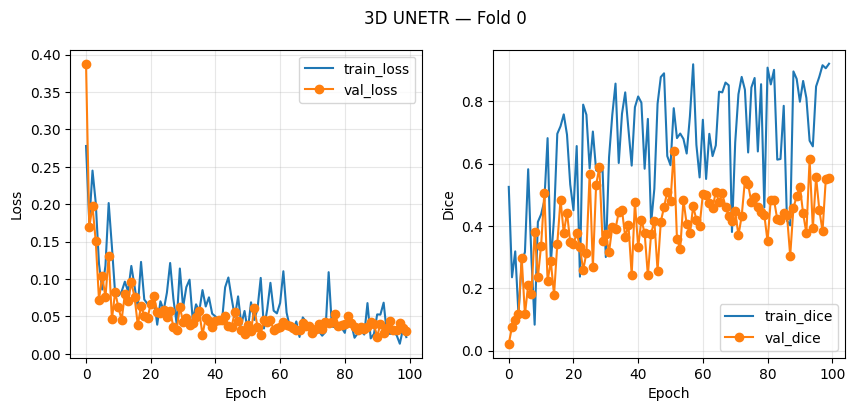

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=100` reached.



========== FOLD fold1 ==========

[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold1\train] Built 88 subjects (missing labels: 0)
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold1\val] Built 22 subjects (missing labels: 0)


Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type         | Params | Mode 
---------------------------------------------------
0 | model     | UNETR        | 146 M  | train
1 | soft_dice | SoftDiceLoss | 0      | train
---------------------------------------------------
146 M     Trainable params
0         Non-trainable params
146 M     Total params
585.249   Total estimated model params size (MB)
319       Modules in train mode
0         Modules in eval mode


Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

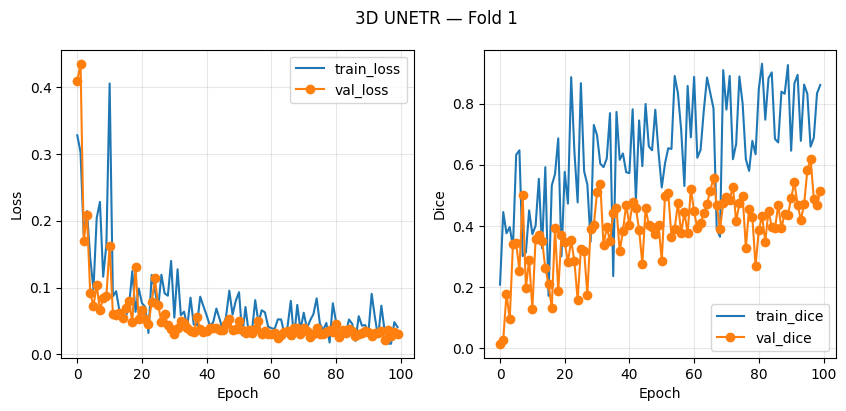

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=100` reached.



========== FOLD fold2 ==========

[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold2\train] Built 88 subjects (missing labels: 0)
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold2\val] Built 22 subjects (missing labels: 0)


Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type         | Params | Mode 
---------------------------------------------------
0 | model     | UNETR        | 146 M  | train
1 | soft_dice | SoftDiceLoss | 0      | train
---------------------------------------------------
146 M     Trainable params
0         Non-trainable params
146 M     Total params
585.249   Total estimated model params size (MB)
319       Modules in train mode
0         Modules in eval mode


Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

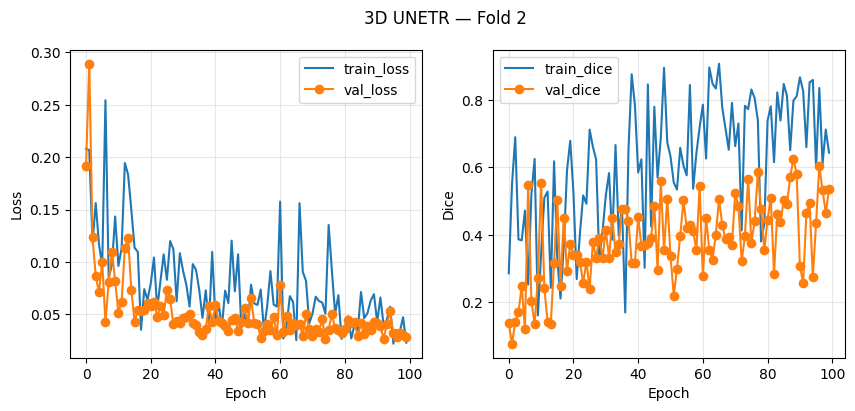

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=100` reached.



========== FOLD fold3 ==========

[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold3\train] Built 88 subjects (missing labels: 0)
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold3\val] Built 22 subjects (missing labels: 0)


Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type         | Params | Mode 
---------------------------------------------------
0 | model     | UNETR        | 146 M  | train
1 | soft_dice | SoftDiceLoss | 0      | train
---------------------------------------------------
146 M     Trainable params
0         Non-trainable params
146 M     Total params
585.249   Total estimated model params size (MB)
319       Modules in train mode
0         Modules in eval mode


Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

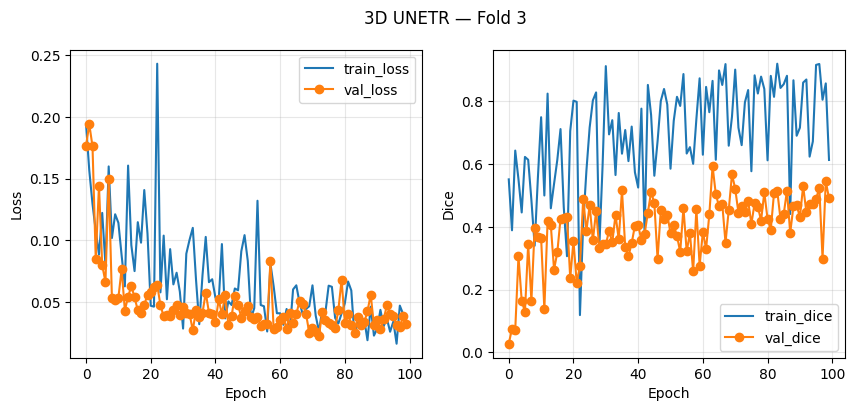

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=100` reached.



========== FOLD fold4 ==========

[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold4\train] Built 88 subjects (missing labels: 0)
[E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split\splits\train\fold4\val] Built 22 subjects (missing labels: 0)


Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type         | Params | Mode 
---------------------------------------------------
0 | model     | UNETR        | 146 M  | train
1 | soft_dice | SoftDiceLoss | 0      | train
---------------------------------------------------
146 M     Trainable params
0         Non-trainable params
146 M     Total params
585.249   Total estimated model params size (MB)
319       Modules in train mode
0         Modules in eval mode


Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

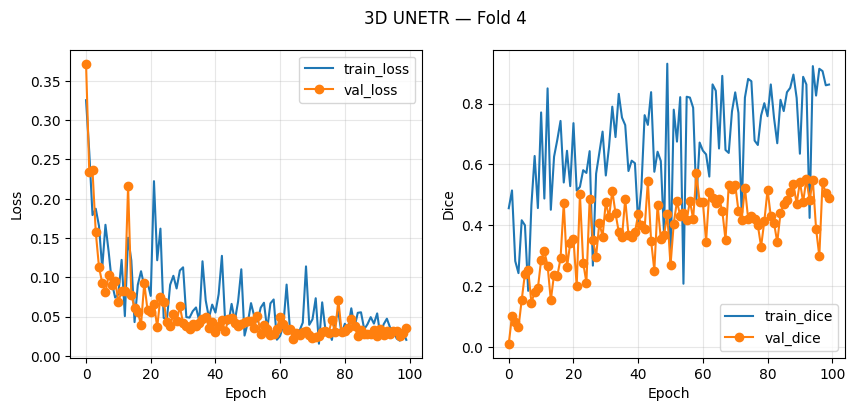

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=100` reached.


In [70]:
from pathlib import Path
PLOTS_DIR = Path("plots_unetr")

# ---------- reproducibility ----------
SEED = 1337
pl.seed_everything(SEED, workers=True)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# ----------------------------
# 5-fold cross-validation loop
# ----------------------------
NUM_FOLDS = 5

for fold_idx in range(NUM_FOLDS):
    fold_key = f"fold{fold_idx}"
    print(f"\n========== FOLD {fold_key} ==========\n")

    # --------------------------------
    # 1) Load subjects for this fold
    # --------------------------------
    train_subjects, val_subjects = load_fold(fold_idx)

    train_dataset = tio.SubjectsDataset(train_subjects, transform=train_transform)
    val_dataset   = tio.SubjectsDataset(val_subjects,   transform=val_transform)

    # patch queues
    train_patches_queue = tio.Queue(
        train_dataset,
        max_length=60,
        samples_per_volume=8,
        sampler=train_sampler,
        num_workers=0,
    )
    val_patches_queue = tio.Queue(
        val_dataset,
        max_length=60,
        samples_per_volume=5,
        sampler=val_sampler,
        num_workers=0,
    )

    # dataloaders
    train_loader = DataLoader(
        train_patches_queue,
        batch_size=train_bs,
        num_workers=0,
        pin_memory=True,
    )
    val_loader = DataLoader(
        val_patches_queue,
        batch_size=val_bs,
        num_workers=0,
        pin_memory=True,
    )

    # ----------------------------
    # model for this fold
    # ----------------------------
    model = Segmenter(
        model=UNETR(
            img_shape=(96, 96, 64),
            input_dim=1,
            output_dim=2,
            embed_dim=768,
            patch_size=16,
            num_heads=12,
            dropout=0.1,
        ),
        lr=1e-4,
        ce_weights=None,
        bce_pos_weight=None,
    )

    # ----------------------------
    # callbacks & logging per fold
    # ----------------------------
    ckpt_loss = ModelCheckpoint(
        dirpath=f"ckpts/fold{fold_idx}/loss",
        filename="loss-{epoch:03d}-{val_loss:.4f}",
        monitor="val_loss",
        mode="min",
        save_top_k=5,
        save_last=True,
    )

    ckpt_dice = ModelCheckpoint(
        dirpath=f"ckpts/fold{fold_idx}/dice",
        filename="dice-{epoch:03d}-{val_dice:.4f}",
        monitor="val_dice",
        mode="max",
        save_top_k=3,
    )

    curve_cb = LiveEpochCurves(
        title=f"3D UNETR — Fold {fold_idx}",
        save_dir=PLOTS_DIR,
        base_filename=f"fold{fold_idx}",  # saves fold0_loss.png, fold0_dice.png, ...
        save_each_epoch=True,
        show_inline=True,
    )

    
    progress_cb = TQDMProgressBar(refresh_rate=1)

    logger = TensorBoardLogger(
        save_dir="./logs",
        name="unetr",
        version=f"fold{fold_idx}",   # separate TB run per fold
    )

    trainer = pl.Trainer(
        accelerator="gpu" if use_gpu else "cpu",
        devices=1 if use_gpu else None,
        logger=logger,
        callbacks=[ckpt_loss, ckpt_dice, progress_cb, curve_cb],
        enable_progress_bar=True,
        log_every_n_steps=1,
        max_epochs=100,
        precision=16 if use_gpu else 32,
        num_sanity_val_steps=0,
        check_val_every_n_epoch=1,
    )
    
    # ----------------------------
    # train this fold
    # ----------------------------
    trainer.fit(model, train_loader, val_loader)

## Build TorchIO test dataset
This code wraps the test subjects in a TorchIO dataset with the chosen preprocessing transform, creating a standardized test set that can be passed directly to dataloaders and inference routines.

In [127]:
import torchio as tio

# If not defined yet:
test_dataset = tio.SubjectsDataset(test_subjects, transform=test_transform)
print("Test subjects:", len(test_dataset))

Test subjects: 40


# Ensemble evaluation on test set using best 5-fold checkpoints
This code loads the best checkpoint from each fold, builds a 5-model ensemble, runs patch-wise sliding-window inference on the test set, and computes volumetric (Dice, IoU, HD95) and patch-wise segmentation metrics in original CT space, summarizing both per-case and overall test performance.

In [128]:
# ============================================
# Ensemble of best 5-fold models on test set
# with per-patient + patch-wise metrics
# evaluated in ORIGINAL volume space
# ============================================
from pathlib import Path
import re
from typing import List, Optional, Tuple

import numpy as np
import torch
import torch.nn.functional as F
import torchio as tio

# ---- config ----
NUM_FOLDS = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# ====================================================
# 1) Basic helpers: IDs, labels, Dice, IoU, HD95, LCC
# ====================================================

def _extract_case_id_from_name(name: str) -> str:
    """
    Examples:
      Lung_003_0000.nii.gz -> '003'
      Lung_003.nii.gz      -> '003'
    Fallback: remove .nii/.nii.gz.
    """
    m = re.match(r"^Lung_([^_]+)_0000\.nii(\.gz)?$", name, flags=re.IGNORECASE)
    if m:
        return m.group(1)
    m = re.match(r"^Lung_([^_]+)\.nii(\.gz)?$", name, flags=re.IGNORECASE)
    if m:
        return m.group(1)
    return re.sub(r"\.nii(\.gz)?$", "", name, flags=re.IGNORECASE)


def get_case_id_from_subject(subject: tio.Subject) -> str:
    """
    Prefer CT path; if missing, try Label path. Returns a concise ID (e.g., '003').
    """
    ct_path = None
    if 'CT' in subject:
        try:
            ct_path = Path(subject['CT'][tio.PATH])
        except Exception:
            ct_obj = subject['CT']
            ct_path = Path(getattr(ct_obj, "path", "")) if hasattr(ct_obj, "path") else None

    if ct_path is None or not str(ct_path):
        lab_path = None
        if 'Label' in subject:
            try:
                lab_path = Path(subject['Label'][tio.PATH])
            except Exception:
                lab_obj = subject['Label']
                lab_path = Path(getattr(lab_obj, "path", "")) if hasattr(lab_obj, "path") else None
        if lab_path is not None and str(lab_path):
            return _extract_case_id_from_name(lab_path.name)

    if ct_path is not None and str(ct_path):
        return _extract_case_id_from_name(ct_path.name)

    return str(subject.get('subject_id', 'unknown'))


def subject_label_to_binary(subject: tio.Subject, tumor_positive_values=(1,)) -> np.ndarray:
    lab = subject['Label'][tio.DATA]      # [1,W,H,D]
    lab = lab[0].detach().cpu().numpy()   # [W,H,D]
    return np.isin(lab, tumor_positive_values).astype(np.uint8)


def dice_binary(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    eps: float = 1e-6,
    empty_ok_as: float = 1.0
) -> float:
    """
    Sørensen–Dice for binary masks.
    If both masks are empty, returns empty_ok_as (default 1.0).
    """
    y_true = (y_true > 0).astype(np.uint8)
    y_pred = (y_pred > 0).astype(np.uint8)
    t_sum, p_sum = y_true.sum(), y_pred.sum()
    if t_sum == 0 and p_sum == 0:
        return float(empty_ok_as)
    inter = (y_true & y_pred).sum()
    return float((2.0 * inter + eps) / (t_sum + p_sum + eps))


def iou_binary(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    eps: float = 1e-6,
    empty_ok_as: float = 1.0,
) -> float:
    """
    Intersection over Union for binary masks.
    If both masks are empty, returns empty_ok_as (default 1.0).
    """
    y_true = (y_true > 0).astype(np.uint8)
    y_pred = (y_pred > 0).astype(np.uint8)
    inter = (y_true & y_pred).sum()
    union = (y_true | y_pred).sum()
    if union == 0:
        return float(empty_ok_as)
    return float((inter + eps) / (union + eps))


def hd95_binary(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    spacing=(1.0, 1.0, 1.0),
) -> float:
    """
    95th percentile Hausdorff distance (HD95) between binary masks.
    Distances are computed in physical units given by `spacing` (sx, sy, sz).

    - If both masks are empty -> 0.0
    - If exactly one mask is empty -> np.inf
    """
    import scipy.ndimage as ndi

    y_true = (y_true > 0).astype(bool)
    y_pred = (y_pred > 0).astype(bool)

    t_sum = y_true.sum()
    p_sum = y_pred.sum()

    if t_sum == 0 and p_sum == 0:
        return 0.0
    if t_sum == 0 or p_sum == 0:
        return float("inf")

    # distance transform of the complements
    dt_true = ndi.distance_transform_edt(~y_true, sampling=spacing)
    dt_pred = ndi.distance_transform_edt(~y_pred, sampling=spacing)

    # surface distances: pred->true and true->pred
    sds_true = dt_pred[y_true]
    sds_pred = dt_true[y_pred]
    sds = np.concatenate([sds_true, sds_pred])

    if sds.size == 0:
        return 0.0
    return float(np.percentile(sds, 95))


def largest_component(mask: np.ndarray) -> np.ndarray:
    """
    Keep only the largest connected component (3D). No-op if mask is empty.
    """
    import scipy.ndimage as ndi
    if mask.sum() == 0:
        return mask
    lab, n = ndi.label(mask.astype(np.uint8))
    if n == 0:
        return mask
    sizes = np.bincount(lab.ravel())
    sizes[0] = 0
    keep = sizes.argmax()
    return (lab == keep).astype(mask.dtype)

# ====================================================
# 2) Robust metric parsing from checkpoint filenames
# ====================================================

def _parse_last_numeric_token(stem: str) -> Optional[float]:
    """
    Fallback: extract last numeric token (int or float) from a filename stem.

    Examples:
      'dice-012-0.6123'          -> 0.6123
      'loss-023-0.4578'          -> 0.4578
      'epoch=3-step=100-val=0.7' -> 0.7
    Returns float or None.
    """
    nums = re.findall(r"[-+]?\d*\.\d+|\d+", stem)
    if not nums:
        return None
    try:
        return float(nums[-1])
    except ValueError:
        return None


def _parse_metric_by_key(stem: str, key: str) -> Optional[float]:
    """
    Parse metric from pattern '...key=VALUE-...' in filename stem.

    Example:
      stem = 'dice-epoch=000-val_dice=0.0220-v4'
      key  = 'val_dice'
      -> returns 0.0220, **not** 4 from '-v4'
    """
    token = f"{key}="
    if token not in stem:
        return None
    try:
        after = stem.split(token, 1)[1]        # '0.0220-v4'
        first = after.split('-', 1)[0]         # '0.0220'
        return float(first)
    except Exception:
        return None

# ====================================================
# 3) Find "best" checkpoint per fold on disk
# ====================================================

def get_best_ckpt_for_fold(fold_idx: int) -> Path:
    """
    Look for:
      1) Best Dice in ckpts/fold{idx}/dice  (maximize val_dice)
      2) Else best loss in ckpts/fold{idx}/loss (minimize val_loss)
      3) Else fallback to ckpts/fold{idx}/loss/last.ckpt
    """
    # -------- 1) Best Dice --------
    dice_dir = Path(f"ckpts/fold{fold_idx}/dice")
    best_dice_path = None
    best_dice_value = None

    if dice_dir.is_dir():
        for ck in dice_dir.glob("*.ckpt"):
            if ck.name == "last.ckpt":
                continue
            stem = ck.stem
            # 1st choice: explicitly parse 'val_dice='
            metric = _parse_metric_by_key(stem, "val_dice")
            # fallback: last numeric token
            if metric is None:
                metric = _parse_last_numeric_token(stem)
            if metric is None:
                continue
            if (best_dice_value is None) or (metric > best_dice_value):
                best_dice_value = metric
                best_dice_path = ck

    if best_dice_path is not None:
        print(f"[Fold {fold_idx}] best Dice ckpt: {best_dice_path.name} (val_dice={best_dice_value:.4f})")
        return best_dice_path

    # -------- 2) Best Loss --------
    loss_dir = Path(f"ckpts/fold{fold_idx}/loss")
    best_loss_path = None
    best_loss_value = None

    if loss_dir.is_dir():
        for ck in loss_dir.glob("*.ckpt"):
            if ck.name == "last.ckpt":
                continue
            stem = ck.stem
            # 1st choice: explicitly parse 'val_loss='
            metric = _parse_metric_by_key(stem, "val_loss")
            # fallback: last numeric token
            if metric is None:
                metric = _parse_last_numeric_token(stem)
            if metric is None:
                continue
            if (best_loss_value is None) or (metric < best_loss_value):
                best_loss_value = metric
                best_loss_path = ck

    if best_loss_path is not None:
        print(f"[Fold {fold_idx}] best Loss ckpt: {best_loss_path.name} (val_loss={best_loss_value:.4f})")
        return best_loss_path

    # -------- 3) fallback: last.ckpt --------
    last_ckpt = loss_dir / "last.ckpt"
    if last_ckpt.is_file():
        print(f"[Fold {fold_idx}] fallback to last.ckpt: {last_ckpt.name}")
        return last_ckpt

    raise FileNotFoundError(f"No checkpoint found for fold {fold_idx} in {dice_dir} or {loss_dir}")

# ====================================================
# 4) Load models for each fold
# ====================================================

def load_model_from_ckpt(ckpt_path: Path):
    """
    Instantiate UNETR with the same config as training,
    then load Segmenter from checkpoint.
    """
    unetr = UNETR(
        img_shape=(96, 96, 64),
        input_dim=1,
        output_dim=2,    # 2 classes: background, tumor
        embed_dim=768,
        patch_size=16,
        num_heads=12,
        dropout=0.1,
    )

    model = Segmenter.load_from_checkpoint(
        checkpoint_path=str(ckpt_path),
        model=unetr,
    )
    model.to(device)
    model.eval()
    return model

# discover best ckpts on disk
fold_ckpts: List[Path] = [get_best_ckpt_for_fold(k) for k in range(NUM_FOLDS)]

# load models
fold_models: List[torch.nn.Module] = []
for fold_idx, ckpt_path in enumerate(fold_ckpts):
    print(f"[Ensemble] Loading fold {fold_idx} from {ckpt_path}")
    model_k = load_model_from_ckpt(ckpt_path)
    fold_models.append(model_k)

print(f"\nLoaded {len(fold_models)} models for ensemble.\n")

# ====================================================
# 5) Build TorchIO test dataset
# ====================================================

# Assumes you already have:
#   test_subjects = build_subjects(BASE / "test", require_label=True)  # ORIGINAL (no transform)
#   test_transform = process                                           # preprocessing
test_dataset = tio.SubjectsDataset(test_subjects, transform=test_transform)
print("Number of test subjects:", len(test_dataset))

# ====================================================
# 6) Evaluate ensemble metrics (per-patient + patch-wise),
#    with volumetric metrics in ORIGINAL space
# ====================================================

@torch.no_grad()
def evaluate_ensemble_metrics_patchwise_original_space(
    test_subjects: List[tio.Subject],
    dataset: tio.SubjectsDataset,
    models: List[torch.nn.Module],
    device: Optional[torch.device] = None,
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',
    tumor_idx: int = 1,
    pos_thresh: float = 0.5,
    tumor_positive_values=(1,),
    postprocess_lcc: bool = False,
    verbose: bool = True,
    empty_ok_as: float = 1.0,
) -> Tuple[
    float, List[float],     # volumetric mean Dice (orig), per-case Dice
    float, List[float],     # volumetric mean HD95 (orig), per-case HD95
    float, List[float],     # volumetric mean IoU  (orig), per-case IoU
    float, float,           # patch micro-mean Dice, IoU (preprocessed patch space)
    List[float], List[float],  # per-case patch-mean Dice, IoU
    int,                    # total #patches
    List[str],              # case_ids
]:
    """
    For each subject i:
      - subject_orig = test_subjects[i]         (original resolution, no transform)
      - subject_proc = dataset[i]              (preprocessed, used for patch loading)
      - Do patch-wise ensemble on subject_proc, aggregate to full prob volume.
      - Wrap probability as a TorchIO image and RESAMPLE to subject_orig['CT'],
        then compute volumetric Dice/IoU/HD95 in ORIGINAL space.
      - Patch-wise Dice/IoU are computed on preprocessed patches (as before).

    Returns:
      vol_mean_dice, vol_dices,
      vol_mean_hd95, vol_hd95s,
      vol_mean_iou,  vol_ious,
      patch_micro_mean_dice, patch_micro_mean_iou,
      patch_case_mean_dice,  patch_case_mean_iou,
      n_patches_total,
      case_ids.
    """
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    assert len(test_subjects) == len(dataset), \
        "test_subjects and dataset must have the same length and matching order."

    # volumetric (original space)
    vol_dices: List[float] = []
    vol_hd95s: List[float] = []
    vol_ious: List[float] = []
    case_ids: List[str] = []

    # patch-wise (preprocessed patches)
    patch_micro_dices_all: List[float] = []
    patch_micro_ious_all: List[float] = []
    patch_case_mean_dice: List[float] = []
    patch_case_mean_iou: List[float] = []
    n_patches_total = 0

    for i in range(len(dataset)):
        subject_orig = test_subjects[i]   # original
        subject_proc = dataset[i]         # preprocessed

        case_id = get_case_id_from_subject(subject_orig)
        case_ids.append(case_id)

        # --- build sampler & aggregator on preprocessed subject ---
        sampler = tio.inference.GridSampler(
            subject_proc,
            patch_size=patch_size,
            patch_overlap=patch_overlap,
        )
        aggregator = tio.inference.GridAggregator(
            sampler,
            overlap_mode=overlap_mode,
        )

        loader = torch.utils.data.DataLoader(
            sampler,
            batch_size=batch_size,
            num_workers=num_workers,
            pin_memory=(device.type == 'cuda'),
            persistent_workers=(num_workers > 0),
        )

        patch_dices_case: List[float] = []
        patch_ious_case: List[float] = []

        for batch in loader:
            x = batch['CT'][tio.DATA].to(device)          # [B,1,w,h,d]
            gt_patches = batch['Label'][tio.DATA]         # [B,1,w,h,d]

            # --- Ensemble probabilities per patch (preprocessed space) ---
            probs_models = []
            for m in models:
                m.to(device)
                m.eval()
                logits = m(x)                             # [B,C,w,h,d] or [B,1,w,h,d]
                if logits.shape[1] == 1:
                    prob_tumor = torch.sigmoid(logits)    # [B,1,w,h,d]
                else:
                    prob = torch.softmax(logits, dim=1)   # [B,C,w,h,d]
                    prob_tumor = prob[:, tumor_idx:tumor_idx+1]
                probs_models.append(prob_tumor)

            # [M,B,1,w,h,d] -> [B,1,w,h,d]
            probs_stack = torch.stack(probs_models, dim=0)
            prob_ens_batch = probs_stack.mean(dim=0)      # [B,1,w,h,d]

            # aggregate for full volume in preprocessed space
            aggregator.add_batch(prob_ens_batch.detach().cpu(), batch[tio.LOCATION])

            # --- patch-wise metrics (still in preprocessed space) ---
            B = prob_ens_batch.shape[0]
            for b in range(B):
                prob_b = prob_ens_batch[b, 0].detach().cpu().numpy()   # [w,h,d]
                pred_bin_patch = (prob_b > pos_thresh).astype(np.uint8)

                gt_b = gt_patches[b, 0].detach().cpu().numpy()         # [w,h,d]
                gt_bin_patch = np.isin(gt_b, tumor_positive_values).astype(np.uint8)

                d_patch = dice_binary(gt_bin_patch, pred_bin_patch, empty_ok_as=empty_ok_as)
                j_patch = iou_binary(gt_bin_patch, pred_bin_patch, empty_ok_as=empty_ok_as)

                patch_dices_case.append(float(d_patch))
                patch_ious_case.append(float(j_patch))

        # --- full probability volume (preprocessed space) ---
        prob_full_proc = aggregator.get_output_tensor()   # [1,W',H',D']

        # Wrap as TorchIO image in preprocessed CT space
        pred_proc_img = tio.ScalarImage(
            tensor=prob_full_proc,                         # [1,W',H',D']
            affine=subject_proc['CT'].affine,
        )

        # --- resample probability to ORIGINAL CT grid ---
        resample_to_orig = tio.Resample(subject_orig['CT'])
        pred_orig_img = resample_to_orig(pred_proc_img)   # [1,W,H,D] in original space
        prob_orig_np = pred_orig_img[tio.DATA][0].numpy() # [W,H,D]

        pred_bin_full = (prob_orig_np > pos_thresh).astype(np.uint8)
        if postprocess_lcc:
            pred_bin_full = largest_component(pred_bin_full)

        # original GT label
        lab_orig_img = subject_orig['Label']
        gt_orig_np = np.isin(
            lab_orig_img[tio.DATA][0].numpy(),            # [W,H,D]
            tumor_positive_values,
        ).astype(np.uint8)

        # spacing for HD95 (mm) in original space
        spacing = getattr(lab_orig_img, "spacing", None)
        if spacing is None:
            spacing = getattr(subject_orig['CT'], "spacing", (1.0, 1.0, 1.0))
        if not (isinstance(spacing, (list, tuple)) and len(spacing) == 3):
            spacing = (1.0, 1.0, 1.0)

        # --- volumetric metrics in ORIGINAL space ---
        d_vol = dice_binary(gt_orig_np, pred_bin_full, empty_ok_as=empty_ok_as)
        j_vol = iou_binary(gt_orig_np, pred_bin_full, empty_ok_as=empty_ok_as)
        h_vol = hd95_binary(gt_orig_np, pred_bin_full, spacing=spacing)

        vol_dices.append(d_vol)
        vol_ious.append(j_vol)
        vol_hd95s.append(h_vol)

        # aggregate patch stats for this case (still preprocessed space)
        n_case = len(patch_dices_case)
        if n_case > 0:
            mean_d_case = float(np.mean(patch_dices_case))
            mean_j_case = float(np.mean(patch_ious_case))
            patch_case_mean_dice.append(mean_d_case)
            patch_case_mean_iou.append(mean_j_case)
            n_patches_total += n_case
            patch_micro_dices_all.extend(patch_dices_case)
            patch_micro_ious_all.extend(patch_ious_case)
        else:
            patch_case_mean_dice.append(float("nan"))
            patch_case_mean_iou.append(float("nan"))

        if verbose:
            h_str = f"{h_vol:.2f}" if np.isfinite(h_vol) else "inf"
            if np.isfinite(patch_case_mean_dice[-1]):
                print(
                    f"[{case_id}] Vol (orig): Dice={d_vol:.4f} | IoU={j_vol:.4f} | HD95={h_str} mm"
                    f"  || Patch mean (proc): Dice={mean_d_case:.4f} | IoU={mean_j_case:.4f} (n={n_case})"
                )
            else:
                print(
                    f"[{case_id}] Vol (orig): Dice={d_vol:.4f} | IoU={j_vol:.4f} | HD95={h_str} mm"
                    f"  || Patch mean: n/a"
                )

    # ---- aggregate over all cases ----
    vol_dices_np = np.asarray(vol_dices, dtype=float)
    vol_ious_np  = np.asarray(vol_ious,  dtype=float)
    vol_hd95_np  = np.asarray(vol_hd95s, dtype=float)

    vol_mean_dice = float(vol_dices_np.mean()) if len(vol_dices_np) else 0.0
    vol_mean_iou  = float(vol_ious_np.mean())  if len(vol_ious_np)  else 0.0

    finite_hd = np.isfinite(vol_hd95_np)
    if finite_hd.any():
        vol_mean_hd95 = float(vol_hd95_np[finite_hd].mean())
    else:
        vol_mean_hd95 = float("inf")

    patch_micro_mean_dice = float(np.mean(patch_micro_dices_all)) if patch_micro_dices_all else 0.0
    patch_micro_mean_iou  = float(np.mean(patch_micro_ious_all))  if patch_micro_ious_all  else 0.0

    if verbose:
        print(f"\n=== Ensemble volumetric metrics in ORIGINAL space over {len(vol_dices)} test cases ===")
        print(f"  Mean Dice : {vol_mean_dice:.4f}")
        print(f"  Mean IoU  : {vol_mean_iou:.4f}")
        if np.isfinite(vol_mean_hd95):
            print(f"  Mean HD95 : {vol_mean_hd95:.2f} mm (finite cases)")
        else:
            print(f"  Mean HD95 : inf (no finite values)")

        print(f"\n=== Ensemble patch-wise metrics across all cases (preprocessed patch space) ===")
        print(f"  Micro Dice (all patches): {patch_micro_mean_dice:.4f} (n={n_patches_total})")
        print(f"  Micro IoU  (all patches): {patch_micro_mean_iou:.4f} (n={n_patches_total})")

    return (
        vol_mean_dice,
        vol_dices,
        vol_mean_hd95,
        vol_hd95s,
        vol_mean_iou,
        vol_ious,
        patch_micro_mean_dice,
        patch_micro_mean_iou,
        patch_case_mean_dice,
        patch_case_mean_iou,
        n_patches_total,
        case_ids,
    )

# ---- run on test set (ORIGINAL-SPACE VOLUME METRICS) ----
common_eval = dict(
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',
    tumor_idx=1,
    pos_thresh=0.5,
    tumor_positive_values=(1,),
    postprocess_lcc=False,
    verbose=True,
)

(
    vol_mean_dice,
    vol_dices,
    vol_mean_hd95,
    vol_hd95s,
    vol_mean_iou,
    vol_ious,
    patch_micro_mean_dice,
    patch_micro_mean_iou,
    patch_case_mean_dice,
    patch_case_mean_iou,
    n_patches_total,
    case_ids,
) = evaluate_ensemble_metrics_patchwise_original_space(
    test_subjects=test_subjects,      # ORIGINAL (no transform)
    dataset=test_dataset,             # preprocessed
    models=fold_models,
    device=device,
    **common_eval,
)

print("\nPer-case ensemble metrics (orig vol + patch-wise):")
for sid, dv, hv, jv, dp, jp in zip(
    case_ids,
    vol_dices,
    vol_hd95s,
    vol_ious,
    patch_case_mean_dice,
    patch_case_mean_iou,
):
    h_str = f"{hv:.2f}" if np.isfinite(hv) else "inf"
    if np.isfinite(dp):
        print(
            f"  {sid}: Vol Dice={dv:.4f} | Vol IoU={jv:.4f} | Vol HD95={h_str} mm"
            f"  || Patch mean Dice={dp:.4f} | Patch mean IoU={jp:.4f}"
        )
    else:
        print(
            f"  {sid}: Vol Dice={dv:.4f} | Vol IoU={jv:.4f} | Vol HD95={h_str} mm"
            f"  || Patch mean: n/a"
        )

print("\nFinal ensemble summary on test set (ORIGINAL volume space):")
print(f"  Volumetric mean Dice : {vol_mean_dice:.4f}")
print(f"  Volumetric mean IoU  : {vol_mean_iou:.4f}")
if np.isfinite(vol_mean_hd95):
    print(f"  Volumetric mean HD95 : {vol_mean_hd95:.2f} mm (finite cases)")
else:
    print(f"  Volumetric mean HD95 : inf (no finite values)")
print(f"  Patch micro Dice (all patches): {patch_micro_mean_dice:.4f} (n={n_patches_total})")
print(f"  Patch micro IoU  (all patches): {patch_micro_mean_iou:.4f} (n={n_patches_total})")

Using device: cuda
[Fold 0] best Dice ckpt: dice-epoch=051-val_dice=0.6405-v1.ckpt (val_dice=0.6405)
[Fold 1] best Dice ckpt: dice-epoch=096-val_dice=0.6202.ckpt (val_dice=0.6202)
[Fold 2] best Dice ckpt: dice-epoch=088-val_dice=0.6263.ckpt (val_dice=0.6263)
[Fold 3] best Dice ckpt: dice-epoch=063-val_dice=0.5935.ckpt (val_dice=0.5935)
[Fold 4] best Dice ckpt: dice-epoch=058-val_dice=0.5713.ckpt (val_dice=0.5713)
[Ensemble] Loading fold 0 from ckpts\fold0\dice\dice-epoch=051-val_dice=0.6405-v1.ckpt
[Ensemble] Loading fold 1 from ckpts\fold1\dice\dice-epoch=096-val_dice=0.6202.ckpt
[Ensemble] Loading fold 2 from ckpts\fold2\dice\dice-epoch=088-val_dice=0.6263.ckpt
[Ensemble] Loading fold 3 from ckpts\fold3\dice\dice-epoch=063-val_dice=0.5935.ckpt
[Ensemble] Loading fold 4 from ckpts\fold4\dice\dice-epoch=058-val_dice=0.5713.ckpt

Loaded 5 models for ensemble.

Number of test subjects: 40
[054] Vol (orig): Dice=0.2792 | IoU=0.1622 | HD95=31.79 mm  || Patch mean (proc): Dice=0.7028 | IoU=

# Ensemble evaluation on test set using LAST-loss 5-fold checkpoints
This code loads the last-loss checkpoint from each of the 5 folds, builds an ensemble, and runs patch-wise sliding-window inference on the test set. It then resamples predictions back to the original CT space to compute volumetric Dice, IoU, and HD95 per patient, along with patch-wise Dice/IoU in the preprocessed space, and summarizes per-case and overall ensemble performance.

In [129]:
from pathlib import Path
import re
from typing import List, Optional, Tuple

import numpy as np
import torch
import torchio as tio

# ---- config ----
NUM_FOLDS = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# ====================================================
# 1) Basic helpers: IDs, labels, Dice, IoU, HD95, LCC
#    (assumes your metric functions are already defined;
#     include them here if not)
# ====================================================

def _extract_case_id_from_name(name: str) -> str:
    """
    Examples:
      Lung_003_0000.nii.gz -> '003'
      Lung_003.nii.gz      -> '003'
    Fallback: remove .nii/.nii.gz.
    """
    m = re.match(r"^Lung_([^_]+)_0000\.nii(\.gz)?$", name, flags=re.IGNORECASE)
    if m:
        return m.group(1)
    m = re.match(r"^Lung_([^_]+)\.nii(\.gz)?$", name, flags=re.IGNORECASE)
    if m:
        return m.group(1)
    return re.sub(r"\.nii(\.gz)?$", "", name, flags=re.IGNORECASE)


def get_case_id_from_subject(subject: tio.Subject) -> str:
    """
    Prefer CT path; if missing, try Label path. Returns a concise ID (e.g., '003').
    """
    ct_path = None
    if 'CT' in subject:
        try:
            ct_path = Path(subject['CT'][tio.PATH])
        except Exception:
            ct_obj = subject['CT']
            ct_path = Path(getattr(ct_obj, "path", "")) if hasattr(ct_obj, "path") else None

    if ct_path is None or not str(ct_path):
        lab_path = None
        if 'Label' in subject:
            try:
                lab_path = Path(subject['Label'][tio.PATH])
            except Exception:
                lab_obj = subject['Label']
                lab_path = Path(getattr(lab_obj, "path", "")) if hasattr(lab_obj, "path") else None
        if lab_path is not None and str(lab_path):
            return _extract_case_id_from_name(lab_path.name)

    if ct_path is not None and str(ct_path):
        return _extract_case_id_from_name(ct_path.name)

    return str(subject.get('subject_id', 'unknown'))


def subject_label_to_binary(subject: tio.Subject, tumor_positive_values=(1,)) -> np.ndarray:
    lab = subject['Label'][tio.DATA]      # [1,W,H,D]
    lab = lab[0].detach().cpu().numpy()   # [W,H,D]
    return np.isin(lab, tumor_positive_values).astype(np.uint8)


def dice_binary(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    eps: float = 1e-6,
    empty_ok_as: float = 1.0
) -> float:
    """
    Sørensen–Dice for binary masks.
    If both masks are empty, returns empty_ok_as (default 1.0).
    """
    y_true = (y_true > 0).astype(np.uint8)
    y_pred = (y_pred > 0).astype(np.uint8)
    t_sum, p_sum = y_true.sum(), y_pred.sum()
    if t_sum == 0 and p_sum == 0:
        return float(empty_ok_as)
    inter = (y_true & y_pred).sum()
    return float((2.0 * inter + eps) / (t_sum + p_sum + eps))


def iou_binary(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    eps: float = 1e-6,
    empty_ok_as: float = 1.0,
) -> float:
    """
    Intersection over Union for binary masks.
    If both masks are empty, returns empty_ok_as (default 1.0).
    """
    y_true = (y_true > 0).astype(np.uint8)
    y_pred = (y_pred > 0).astype(np.uint8)
    inter = (y_true & y_pred).sum()
    union = (y_true | y_pred).sum()
    if union == 0:
        return float(empty_ok_as)
    return float((inter + eps) / (union + eps))


def hd95_binary(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    spacing=(1.0, 1.0, 1.0),
) -> float:
    """
    95th percentile Hausdorff distance (HD95) between binary masks.
    Distances are computed in physical units given by `spacing` (sx, sy, sz).

    - If both masks are empty -> 0.0
    - If exactly one mask is empty -> np.inf
    """
    import scipy.ndimage as ndi

    y_true = (y_true > 0).astype(bool)
    y_pred = (y_pred > 0).astype(bool)

    t_sum = y_true.sum()
    p_sum = y_pred.sum()

    if t_sum == 0 and p_sum == 0:
        return 0.0
    if t_sum == 0 or p_sum == 0:
        return float("inf")

    # distance transform of the complements
    dt_true = ndi.distance_transform_edt(~y_true, sampling=spacing)
    dt_pred = ndi.distance_transform_edt(~y_pred, sampling=spacing)

    # surface distances: pred->true and true->pred
    sds_true = dt_pred[y_true]
    sds_pred = dt_true[y_pred]
    sds = np.concatenate([sds_true, sds_pred])

    if sds.size == 0:
        return 0.0
    return float(np.percentile(sds, 95))


def largest_component(mask: np.ndarray) -> np.ndarray:
    """
    Keep only the largest connected component (3D). No-op if mask is empty.
    """
    import scipy.ndimage as ndi
    if mask.sum() == 0:
        return mask
    lab, n = ndi.label(mask.astype(np.uint8))
    if n == 0:
        return mask
    sizes = np.bincount(lab.ravel())
    sizes[0] = 0
    keep = sizes.argmax()
    return (lab == keep).astype(mask.dtype)


# ====================================================
# 2) Get LAST loss checkpoint per fold (with prints)
# ====================================================

def get_last_loss_ckpt_for_fold(fold_idx: int) -> Path:
    """
    Just use ckpts/fold{idx}/loss/last.ckpt.
    Raises if not found. Prints which ckpt is chosen.
    """
    loss_dir = Path(f"ckpts/fold{fold_idx}/loss")
    ckpt = loss_dir / "last.ckpt"
    if not ckpt.is_file():
        raise FileNotFoundError(f"last.ckpt not found for fold {fold_idx} in {loss_dir}")
    print(f"[Fold {fold_idx}] LAST-loss ckpt: {ckpt.name}")
    return ckpt


# ====================================================
# 3) Load LAST-loss models for each fold (with prints)
# ====================================================

def load_model_from_ckpt(ckpt_path: Path):
    """
    Instantiate UNETR with the same config as training,
    then load Segmenter from checkpoint.
    """
    unetr = UNETR(
        img_shape=(96, 96, 64),
        input_dim=1,
        output_dim=2,    # 2 classes: background, tumor
        embed_dim=768,
        patch_size=16,
        num_heads=12,
        dropout=0.1,
    )

    model = Segmenter.load_from_checkpoint(
        checkpoint_path=str(ckpt_path),
        model=unetr,
    )
    model.to(device)
    model.eval()
    return model

# discover last-loss ckpts on disk (prints per fold)
fold_ckpts: List[Path] = [get_last_loss_ckpt_for_fold(k) for k in range(NUM_FOLDS)]

# load models (prints like the best-Dice version)
fold_models: List[torch.nn.Module] = []
for fold_idx, ckpt_path in enumerate(fold_ckpts):
    print(f"[Ensemble-last] Loading fold {fold_idx} from {ckpt_path}")
    model_k = load_model_from_ckpt(ckpt_path)
    fold_models.append(model_k)

print(f"\nLoaded {len(fold_models)} LAST-loss models for ensemble.\n")

# ====================================================
# 4) Build TorchIO test dataset (preprocessed)
# ====================================================

# Assumes you already have:
#   test_subjects = build_subjects(BASE / "test", require_label=True)   # ORIGINAL
#   test_transform = process
test_dataset = tio.SubjectsDataset(test_subjects, transform=test_transform)
print("Number of test subjects:", len(test_dataset))


# ====================================================
# 5) Evaluate ensemble metrics
#     (volumetric in ORIGINAL space + patch-wise)
# ====================================================

@torch.no_grad()
def evaluate_ensemble_metrics_patchwise_last_original_space(
    test_subjects: List[tio.Subject],        # ORIGINAL subjects (no transform)
    dataset: tio.SubjectsDataset,            # preprocessed subjects (with test_transform)
    models: List[torch.nn.Module],
    device: Optional[torch.device] = None,
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',
    tumor_idx: int = 1,
    pos_thresh: float = 0.5,
    tumor_positive_values=(1,),
    postprocess_lcc: bool = False,
    verbose: bool = True,
    empty_ok_as: float = 1.0,
) -> Tuple[
    float, List[float],     # volumetric mean Dice (orig), per-case Dice
    float, List[float],     # volumetric mean HD95 (orig), per-case HD95
    float, List[float],     # volumetric mean IoU  (orig), per-case IoU
    float, float,           # patch micro-mean Dice, IoU (preprocessed space)
    List[float], List[float],  # per-case patch-mean Dice, IoU
    int,                    # total #patches
    List[str],              # case_ids
]:
    """
    LAST-loss ensemble evaluation with:
      - Volumetric Dice / IoU / HD95 per case in ORIGINAL image space.
      - Patch-wise Dice / IoU in PREPROCESSED patch space.

    Assumes:
      * test_subjects[i] is the ORIGINAL subject (no transform).
      * dataset[i]       is the preprocessed version of the same case.
    """
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    assert len(test_subjects) == len(dataset), \
        "test_subjects and dataset must have the same length and matching order."

    # volumetric (original space)
    vol_dices: List[float] = []
    vol_hd95s: List[float] = []
    vol_ious: List[float] = []
    case_ids: List[str] = []

    # patch-wise (preprocessed space)
    patch_micro_dices_all: List[float] = []
    patch_micro_ious_all: List[float] = []
    patch_case_mean_dice: List[float] = []
    patch_case_mean_iou: List[float] = []
    n_patches_total = 0

    for i in range(len(dataset)):
        subject_orig = test_subjects[i]   # ORIGINAL (no transform)
        subject_proc = dataset[i]         # preprocessed

        case_id = get_case_id_from_subject(subject_orig)
        case_ids.append(case_id)

        # ---- sampler & aggregator in PREPROCESSED space ----
        sampler = tio.inference.GridSampler(
            subject_proc,
            patch_size=patch_size,
            patch_overlap=patch_overlap,
        )
        aggregator = tio.inference.GridAggregator(
            sampler,
            overlap_mode=overlap_mode,
        )

        loader = torch.utils.data.DataLoader(
            sampler,
            batch_size=batch_size,
            num_workers=num_workers,
            pin_memory=(device.type == 'cuda'),
            persistent_workers=(num_workers > 0),
        )

        patch_dices_case: List[float] = []
        patch_ious_case: List[float] = []

        for batch in loader:
            x = batch['CT'][tio.DATA].to(device)      # [B,1,w,h,d]
            gt_patches = batch['Label'][tio.DATA]     # [B,1,w,h,d]

            # --- ensemble patch probabilities (preprocessed space) ---
            probs_models = []
            for m in models:
                m.to(device)
                m.eval()
                logits = m(x)                         # [B,C,w,h,d] or [B,1,w,h,d]
                if logits.shape[1] == 1:
                    prob_tumor = torch.sigmoid(logits)       # [B,1,w,h,d]
                else:
                    prob = torch.softmax(logits, dim=1)       # [B,C,w,h,d]
                    prob_tumor = prob[:, tumor_idx:tumor_idx+1]
                probs_models.append(prob_tumor)

            probs_stack = torch.stack(probs_models, dim=0)     # [M,B,1,w,h,d]
            prob_ens_batch = probs_stack.mean(dim=0)           # [B,1,w,h,d]

            # aggregate for full prob volume in PREPROCESSED space
            aggregator.add_batch(prob_ens_batch.detach().cpu(), batch[tio.LOCATION])

            # --- patch-wise metrics (preprocessed space) ---
            B = prob_ens_batch.shape[0]
            for b in range(B):
                prob_b = prob_ens_batch[b, 0].detach().cpu().numpy()   # [w,h,d]
                pred_bin_patch = (prob_b > pos_thresh).astype(np.uint8)

                gt_b = gt_patches[b, 0].detach().cpu().numpy()         # [w,h,d]
                gt_bin_patch = np.isin(gt_b, tumor_positive_values).astype(np.uint8)

                d_patch = dice_binary(gt_bin_patch, pred_bin_patch, empty_ok_as=empty_ok_as)
                j_patch = iou_binary(gt_bin_patch, pred_bin_patch, empty_ok_as=empty_ok_as)

                patch_dices_case.append(float(d_patch))
                patch_ious_case.append(float(j_patch))

        # ===== volumetric metrics in ORIGINAL space =====
        # full prob volume in PREPROCESSED space
        prob_full_proc = aggregator.get_output_tensor()         # [1,W',H',D']

        # wrap as TorchIO image with processed CT affine
        pred_proc_img = tio.ScalarImage(
            tensor=prob_full_proc,                              # [1,W',H',D']
            affine=subject_proc['CT'].affine,
        )

        # resample probability to ORIGINAL CT grid
        resample_to_orig = tio.Resample(subject_orig['CT'])
        pred_orig_img = resample_to_orig(pred_proc_img)         # [1,W,H,D] in original space
        prob_orig_np = pred_orig_img[tio.DATA][0].numpy()       # [W,H,D]

        pred_bin_full = (prob_orig_np > pos_thresh).astype(np.uint8)
        if postprocess_lcc:
            pred_bin_full = largest_component(pred_bin_full)

        # ground-truth in ORIGINAL space
        lab_orig_img = subject_orig['Label']
        gt_orig_np = np.isin(
            lab_orig_img[tio.DATA][0].numpy(),                  # [W,H,D]
            tumor_positive_values,
        ).astype(np.uint8)

        # spacing for HD95 (mm) in ORIGINAL space
        spacing = getattr(lab_orig_img, "spacing", None)
        if spacing is None:
            spacing = getattr(subject_orig['CT'], "spacing", (1.0, 1.0, 1.0))
        if not (isinstance(spacing, (list, tuple)) and len(spacing) == 3):
            spacing = (1.0, 1.0, 1.0)

        d_vol = dice_binary(gt_orig_np, pred_bin_full, empty_ok_as=empty_ok_as)
        j_vol = iou_binary(gt_orig_np, pred_bin_full, empty_ok_as=empty_ok_as)
        h_vol = hd95_binary(gt_orig_np, pred_bin_full, spacing=spacing)

        vol_dices.append(d_vol)
        vol_ious.append(j_vol)
        vol_hd95s.append(h_vol)

        # ---- aggregate patch stats for this case (preprocessed space) ----
        n_case = len(patch_dices_case)
        if n_case > 0:
            mean_d_case = float(np.mean(patch_dices_case))
            mean_j_case = float(np.mean(patch_ious_case))
            patch_case_mean_dice.append(mean_d_case)
            patch_case_mean_iou.append(mean_j_case)
            n_patches_total += n_case
            patch_micro_dices_all.extend(patch_dices_case)
            patch_micro_ious_all.extend(patch_ious_case)
        else:
            patch_case_mean_dice.append(float("nan"))
            patch_case_mean_iou.append(float("nan"))

        if verbose:
            h_str = f"{h_vol:.2f}" if np.isfinite(h_vol) else "inf"
            if np.isfinite(patch_case_mean_dice[-1]):
                print(
                    f"[{case_id}] Vol (orig): Dice={d_vol:.4f} | IoU={j_vol:.4f} | HD95={h_str} mm"
                    f"  || Patch mean (proc): Dice={mean_d_case:.4f} | IoU={mean_j_case:.4f} (n={n_case})"
                )
            else:
                print(
                    f"[{case_id}] Vol (orig): Dice={d_vol:.4f} | IoU={j_vol:.4f} | HD95={h_str} mm"
                    f"  || Patch mean: n/a"
                )

    # ---- aggregate over all cases ----
    vol_dices_np = np.asarray(vol_dices, dtype=float)
    vol_ious_np  = np.asarray(vol_ious,  dtype=float)
    vol_hd95_np  = np.asarray(vol_hd95s, dtype=float)

    vol_mean_dice = float(vol_dices_np.mean()) if len(vol_dices_np) else 0.0
    vol_mean_iou  = float(vol_ious_np.mean())  if len(vol_ious_np)  else 0.0

    finite_hd = np.isfinite(vol_hd95_np)
    if finite_hd.any():
        vol_mean_hd95 = float(vol_hd95_np[finite_hd].mean())
    else:
        vol_mean_hd95 = float("inf")

    patch_micro_mean_dice = float(np.mean(patch_micro_dices_all)) if patch_micro_dices_all else 0.0
    patch_micro_mean_iou  = float(np.mean(patch_micro_ious_all))  if patch_micro_ious_all  else 0.0

    if verbose:
        print(f"\n=== LAST-loss ensemble volumetric metrics in ORIGINAL space over {len(vol_dices)} test cases ===")
        print(f"  Mean Dice : {vol_mean_dice:.4f}")
        print(f"  Mean IoU  : {vol_mean_iou:.4f}")
        if np.isfinite(vol_mean_hd95):
            print(f"  Mean HD95 : {vol_mean_hd95:.2f} mm (finite cases)")
        else:
            print(f"  Mean HD95 : inf (no finite values)")

        print(f"\n=== LAST-loss ensemble patch-wise metrics (preprocessed patch space) ===")
        print(f"  Micro Dice (all patches): {patch_micro_mean_dice:.4f} (n={n_patches_total})")
        print(f"  Micro IoU  (all patches): {patch_micro_mean_iou:.4f} (n={n_patches_total})")

    return (
        vol_mean_dice,
        vol_dices,
        vol_mean_hd95,
        vol_hd95s,
        vol_mean_iou,
        vol_ious,
        patch_micro_mean_dice,
        patch_micro_mean_iou,
        patch_case_mean_dice,
        patch_case_mean_iou,
        n_patches_total,
        case_ids,
    )


# ---- run on test set (ORIGINAL-SPACE volumes) ----
common_eval = dict(
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',
    tumor_idx=1,
    pos_thresh=0.5,
    tumor_positive_values=(1,),
    postprocess_lcc=False,
    verbose=True,
)

(
    vol_mean_dice_last,
    vol_dices_last,
    vol_mean_hd95_last,
    vol_hd95s_last,
    vol_mean_iou_last,
    vol_ious_last,
    patch_micro_mean_dice_last,
    patch_micro_mean_iou_last,
    patch_case_mean_dice_last,
    patch_case_mean_iou_last,
    n_patches_total_last,
    case_ids_last,
) = evaluate_ensemble_metrics_patchwise_last_original_space(
    test_subjects=test_subjects,   # ORIGINAL subjects (no transform)
    dataset=test_dataset,          # preprocessed SubjectsDataset
    models=fold_models,
    device=device,
    **common_eval,
)

print("\nPer-case LAST-loss ensemble metrics (orig vol + patch-wise):")
for sid, dv, hv, jv, dp, jp in zip(
    case_ids_last,
    vol_dices_last,
    vol_hd95s_last,
    vol_ious_last,
    patch_case_mean_dice_last,
    patch_case_mean_iou_last,
):
    h_str = f"{hv:.2f}" if np.isfinite(hv) else "inf"
    if np.isfinite(dp):
        print(
            f"  {sid}: Vol Dice={dv:.4f} | Vol IoU={jv:.4f} | Vol HD95={h_str} mm"
            f"  || Patch mean Dice={dp:.4f} | Patch mean IoU={jp:.4f}"
        )
    else:
        print(
            f"  {sid}: Vol Dice={dv:.4f} | Vol IoU={jv:.4f} | Vol HD95={h_str} mm"
            f"  || Patch mean: n/a"
        )

print("\nFinal LAST-loss ensemble summary on test set (ORIGINAL volume space):")
print(f"  Volumetric mean Dice : {vol_mean_dice_last:.4f}")
print(f"  Volumetric mean IoU  : {vol_mean_iou_last:.4f}")
if np.isfinite(vol_mean_hd95_last):
    print(f"  Volumetric mean HD95 : {vol_mean_hd95_last:.2f} mm (finite cases)")
else:
    print(f"  Volumetric mean HD95 : inf (no finite values)")
print(f"  Patch micro Dice (all patches): {patch_micro_mean_dice_last:.4f} (n={n_patches_total_last})")
print(f"  Patch micro IoU  (all patches): {patch_micro_mean_iou_last:.4f} (n={n_patches_total_last})")

Using device: cuda
[Fold 0] LAST-loss ckpt: last.ckpt
[Fold 1] LAST-loss ckpt: last.ckpt
[Fold 2] LAST-loss ckpt: last.ckpt
[Fold 3] LAST-loss ckpt: last.ckpt
[Fold 4] LAST-loss ckpt: last.ckpt
[Ensemble-last] Loading fold 0 from ckpts\fold0\loss\last.ckpt
[Ensemble-last] Loading fold 1 from ckpts\fold1\loss\last.ckpt
[Ensemble-last] Loading fold 2 from ckpts\fold2\loss\last.ckpt
[Ensemble-last] Loading fold 3 from ckpts\fold3\loss\last.ckpt
[Ensemble-last] Loading fold 4 from ckpts\fold4\loss\last.ckpt

Loaded 5 LAST-loss models for ensemble.

Number of test subjects: 40
[054] Vol (orig): Dice=0.6069 | IoU=0.4357 | HD95=15.22 mm  || Patch mean (proc): Dice=0.7290 | IoU=0.7081 (n=96)
[062] Vol (orig): Dice=0.7357 | IoU=0.5820 | HD95=9.81 mm  || Patch mean (proc): Dice=0.7334 | IoU=0.7287 (n=96)
[065] Vol (orig): Dice=0.6859 | IoU=0.5219 | HD95=12.00 mm  || Patch mean (proc): Dice=0.7678 | IoU=0.7519 (n=96)
[081] Vol (orig): Dice=0.1438 | IoU=0.0774 | HD95=26.57 mm  || Patch mean (proc)

# Animated visualization of CT, ensemble prediction, and ground truth
This code selects a test case, runs the LAST-loss 5-fold ensemble to generate a 3D probability map, computes sample metrics, and then creates an animation of axial CT slices overlaid with the ensemble tumor prediction and ground-truth mask in the preprocessed space for qualitative visual assessment.

In [130]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
import torchio as tio

# -------------------------------
# 1) Pick a test subject + ensemble prediction (PREPROCESSED space)
# -------------------------------
IDX = 12   # change to any test index you like

subject = test_dataset[IDX]                 # preprocessed subject
case_id = get_case_id_from_subject(subject)

ct_vol  = subject["CT"][tio.DATA]          # [1, W, H, D]
lab_vol = subject["Label"][tio.DATA]       # [1, W, H, D]
gt_np   = (lab_vol[0].detach().cpu().numpy() > 0).astype(np.uint8)  # [W,H,D]

print(f"Visualizing test subject index {IDX} (case_id={case_id})")
print("  CT shape   :", ct_vol.shape)
print("  Label shape:", lab_vol.shape)

# ensemble probability [W,H,D] using LAST 5-fold models (PREPROCESSED space)
pos_thresh = 0.5

prob_ens = ensemble_predict_full_volume(
    subject,
    models=fold_models,      # last-loss models
    device=device,
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',
    tumor_idx=1,
)  # torch.Tensor [W,H,D] on CPU

print("  Prob shape :", prob_ens.shape)

# binarize ensemble prediction
pred_np = (prob_ens.numpy() > pos_thresh).astype(np.uint8)

# optional: metrics for this subject (PREPROCESSED space)
spacing = getattr(subject['Label'], "spacing", None)
if spacing is None:
    spacing = getattr(subject['CT'], "spacing", (1.0, 1.0, 1.0))
if not (isinstance(spacing, (list, tuple)) and len(spacing) == 3):
    spacing = (1.0, 1.0, 1.0)

d  = dice_binary(gt_np, pred_np)
j  = iou_binary(gt_np, pred_np)
h  = hd95_binary(gt_np, pred_np, spacing=spacing)
h_str = f"{h:.2f}" if np.isfinite(h) else "inf"

print(f"\n[Sample metrics — ensemble LAST models (PREPROCESSED space)]")
print(f"  Dice: {d:.4f}")
print(f"  IoU : {j:.4f}")
print(f"  HD95: {h_str} mm")

# -------------------------------
# 2) Helpers for orientation & display
# -------------------------------
def to_np(x):
    return x.detach().cpu().numpy() if hasattr(x, "detach") else np.asarray(x)

def reorient_2d(a):
    # keep your original “fixed” orientation
    return np.rot90(np.flipud(a), k=3)

def rot180(a):
    return np.rot90(a, k=2)

def flip_tb(a):
    # top–bottom flip after your existing ops
    return np.flipud(a)

def make_depth_slicer(vol, D):
    """
    Returns a function get_slice(i) that returns [H,W] for depth index i.
    Handles shapes:
      - [1,W,H,D]
      - [W,H,D]
      - [D,H,W]
    """
    a = to_np(vol)
    if a.ndim == 4:  # [1,W,H,D]
        b = a[0]
        if b.shape[-1] == D:
            return lambda i: np.squeeze(b[:, :, i])   # [W,H]
        if b.shape[0] == D:
            return lambda i: np.squeeze(b[i, :, :])   # [H,W]
    elif a.ndim == 3:  # [W,H,D] or [D,H,W]
        if a.shape[-1] == D:
            return lambda i: np.squeeze(a[:, :, i])
        if a.shape[0] == D:
            return lambda i: np.squeeze(a[i, :, :])
    raise ValueError(f"Can't determine depth axis for shape {a.shape} with D={D}")

def window_ct_hu(img, wl=-600, ww=1500):
    lo, hi = wl - ww / 2, wl + ww / 2
    x = np.nan_to_num(img.astype(np.float32), nan=lo)
    x = np.clip(x, lo, hi)
    return (x - lo) / (hi - lo + 1e-6)

def normalize_for_display(img):
    x = np.nan_to_num(img.astype(np.float32), nan=0.0)
    vmin, vmax = np.percentile(x, [1, 99])
    looks_like_hu = (x.min() < -500) or (x.max() > 200) or (vmax - vmin > 800)
    if looks_like_hu:
        return window_ct_hu(x)
    if vmax - vmin < 1e-6:
        return np.zeros_like(x) + 0.5
    return (np.clip(x, vmin, vmax) - vmin) / (vmax - vmin + 1e-6)

# -------------------------------
# 3) Prepare slicers for CT / GT / pred (PREPROCESSED space)
# -------------------------------
D = pred_np.shape[-1]

get_img = make_depth_slicer(ct_vol, D)   # CT [1,W,H,D]
get_gt  = make_depth_slicer(gt_np, D)    # GT [W,H,D]

# -------------------------------
# 4) Animation (CT + ensemble pred + GT)
# -------------------------------
fig, ax = plt.subplots()
ax.set_axis_off()
ax.set_title(f"Test case {case_id} – ensemble LAST models (preprocessed)", fontsize=10)

# initial slice (0)
ct0 = flip_tb(rot180(reorient_2d(normalize_for_display(get_img(0)))))
im_ct = ax.imshow(ct0, cmap="bone", vmin=0, vmax=1, zorder=0, origin="lower")

p0 = flip_tb(rot180(reorient_2d(pred_np[:, :, 0])))
im_pred = ax.imshow(
    np.ma.masked_where(p0 <= 0, p0.astype(float)),
    alpha=0.35,
    cmap="autumn",
    interpolation="nearest",
    zorder=3,
    origin="lower",
)

gt0 = flip_tb(rot180(reorient_2d(get_gt(0))))
im_gt = ax.imshow(
    np.ma.masked_where(gt0 <= 0, gt0.astype(float)),
    alpha=0.35,
    cmap="winter",
    interpolation="nearest",
    zorder=2,
    origin="lower",
)

def update(i):
    # base CT
    ct = flip_tb(rot180(reorient_2d(normalize_for_display(get_img(i)))))
    im_ct.set_data(ct)

    # ensemble prediction
    p = flip_tb(rot180(reorient_2d(pred_np[:, :, i])))
    im_pred.set_data(np.ma.masked_where(p <= 0, p.astype(float)))

    # GT
    gt = flip_tb(rot180(reorient_2d(get_gt(i))))
    im_gt.set_data(np.ma.masked_where(gt <= 0, gt.astype(float)))

    return im_ct, im_pred, im_gt

def init():
    return update(0)

ani = FuncAnimation(
    fig,
    update,
    frames=range(0, D, 2),   # step through slices
    init_func=init,
    interval=60,
    blit=False,
    repeat=False,
)

html = ani.to_jshtml()
plt.close(fig)
display(HTML(html))

Visualizing test subject index 12 (case_id=247)
  CT shape   : torch.Size([1, 256, 256, 200])
  Label shape: torch.Size([1, 256, 256, 200])
  Prob shape : torch.Size([256, 256, 200])

[Sample metrics — ensemble LAST models (PREPROCESSED space)]
  Dice: 0.7158
  IoU : 0.5574
  HD95: 14.23 mm


# Collect BASE and TTA ensemble probabilities in original CT space
This code loops over all cases, runs the ensemble once normally and once with test-time augmentations (axis flips), resamples both probability volumes back to the original CT grid, and stores them together with the ground-truth mask and voxel spacing. The resulting list is then used to search for an optimal TTA threshold and to compare BASE vs. TTA performance in a consistent, patient-level coordinate space.

In [134]:
import numpy as np
import torch
import torchio as tio
from typing import List, Dict, Any, Optional, Tuple

@torch.no_grad()
def collect_base_tta_probs_original_space(
    subjects: List[tio.Subject],          # ORIGINAL subjects (no transform)
    dataset: tio.SubjectsDataset,         # PREPROCESSED SubjectsDataset
    models: List[torch.nn.Module],
    device: Optional[torch.device] = None,
    patch_size: Tuple[int, int, int] = (96, 96, 64),
    patch_overlap: Tuple[int, int, int] = (32, 32, 32),
    batch_size: int = 2,
    num_workers: int = 0,
    overlap_mode: str = "average",
    tumor_idx: int = 1,
    flips=((0,), (1,), (2,), (0, 1)),
    tumor_positive_values=(1,),
    **unused_kwargs,   # <-- swallows pos_thresh or any other extra args
) -> List[Dict[str, Any]]:
    """
    For each case, compute:
      - BASE ensemble prob volume in ORIGINAL space
      - TTA ensemble prob volume in ORIGINAL space
      - Ground truth mask in ORIGINAL space
    and return them in a list of dicts suitable for
    evaluate_collection_with_thresholds / find_best_tta_threshold.
    """
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    assert len(subjects) == len(dataset), \
        "subjects (original) and dataset (preprocessed) must have same length."

    results: List[Dict[str, Any]] = []

    for i in range(len(dataset)):
        subj_orig = subjects[i]
        subj_proc = dataset[i]

        case_id = get_case_id_from_subject(subj_orig)
        print(f"[Collect] ({i:03d}) case_id={case_id}")

        # ---------- BASE (no TTA) in PREPROCESSED space ----------
        prob_base_proc = ensemble_predict_full_volume(
            subj_proc,
            models=models,
            device=device,
            patch_size=patch_size,
            patch_overlap=patch_overlap,
            batch_size=batch_size,
            num_workers=num_workers,
            overlap_mode=overlap_mode,
            tumor_idx=tumor_idx,
        )  # [W',H',D'] on CPU

        # ---------- TTA in PREPROCESSED space ----------
        prob_tta_proc = ensemble_predict_full_volume_patch_tta(
            subj_proc,
            models=models,
            device=device,
            patch_size=patch_size,
            patch_overlap=patch_overlap,
            batch_size=batch_size,
            num_workers=num_workers,
            overlap_mode=overlap_mode,
            tumor_idx=tumor_idx,
            flips=flips,
        )  # [W',H',D'] on CPU

        # ---------- Wrap & resample both to ORIGINAL CT grid ----------
        prob_base_img = tio.ScalarImage(
            tensor=prob_base_proc.unsqueeze(0),   # [1,W',H',D']
            affine=subj_proc['CT'].affine,
        )
        prob_tta_img = tio.ScalarImage(
            tensor=prob_tta_proc.unsqueeze(0),    # [1,W',H',D']
            affine=subj_proc['CT'].affine,
        )

        resample_to_orig = tio.Resample(subj_orig['CT'])
        base_orig_img = resample_to_orig(prob_base_img)   # [1,W,H,D]
        tta_orig_img  = resample_to_orig(prob_tta_img)    # [1,W,H,D]

        prob_base_orig = base_orig_img[tio.DATA][0].numpy()  # [W,H,D]
        prob_tta_orig  = tta_orig_img[tio.DATA][0].numpy()   # [W,H,D]

        # ---------- Ground truth in ORIGINAL space ----------
        lab_orig_img = subj_orig['Label']
        gt_orig_np = np.isin(
            lab_orig_img[tio.DATA][0].numpy(),
            tumor_positive_values,
        ).astype(np.uint8)

        # spacing for HD95 in ORIGINAL space (mm) — anisotropic-safe
        spacing = getattr(lab_orig_img, "spacing", None)
        if spacing is None:
            spacing = getattr(subj_orig['CT'], "spacing", (1.0, 1.0, 1.0))
        if not (isinstance(spacing, (list, tuple)) and len(spacing) == 3):
            spacing = (1.0, 1.0, 1.0)

        results.append(
            dict(
                case_id=case_id,
                prob_base_orig=prob_base_orig,
                prob_tta_orig=prob_tta_orig,
                gt_orig_np=gt_orig_np,
                spacing=spacing,
            )
        )

    return results

# Tune TTA threshold on validation set
This code first collects BASE and TTA ensemble probability maps for all validation cases, then performs a grid search over possible TTA thresholds (0.1–0.9) to find the value that maximizes the Dice improvement over the non-TTA baseline. It prints the best threshold and its associated validation metrics for later use on the test set.

In [135]:
import numpy as np
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

common_eval = dict(
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',
    tumor_idx=1,
    # do NOT put thresholds here
)

# ---------- 1) Collect BASE + TTA probabilities on validation set ----------
val_results = collect_base_tta_probs_original_space(
    subjects=val_subjects,   # ORIGINAL subjects
    dataset=val_dataset,     # PREPROCESSED SubjectsDataset
    models=fold_models,      # LAST-loss 3D UNETR ensemble
    device=device,
    **common_eval,
)

# ---------- 2) Grid-search TTA threshold to maximize Dice gain ----------
tta_grid = np.arange(0.1, 1.0, 0.1)  # 0.1, 0.2, ..., 0.9

best_tta_thr, metrics_by_thr = find_best_tta_threshold(
    results=val_results,         # <-- match variable name
    tta_thresholds=tta_grid,
    pos_thresh_base=0.5,
    postprocess_lcc=False,
)

print("Best TTA threshold (by Dice gain):", best_tta_thr)
print("Metrics at best threshold:", metrics_by_thr[best_tta_thr])
print("Dice gain:", metrics_by_thr[best_tta_thr]["dice_gain"])

[Collect] (000) case_id=043
[Collect] (001) case_id=080
[Collect] (002) case_id=159
[Collect] (003) case_id=209
[Collect] (004) case_id=212
[Collect] (005) case_id=287
[Collect] (006) case_id=316
[Collect] (007) case_id=337
[Collect] (008) case_id=345
[Collect] (009) case_id=356
[Collect] (010) case_id=476
[Collect] (011) case_id=508
[Collect] (012) case_id=601
[Collect] (013) case_id=621
[Collect] (014) case_id=630
[Collect] (015) case_id=644
[Collect] (016) case_id=666
[Collect] (017) case_id=693
[Collect] (018) case_id=714
[Collect] (019) case_id=803
[Collect] (020) case_id=821
[Collect] (021) case_id=875
Best TTA threshold (by Dice gain): 0.30000000000000004
Metrics at best threshold: {'dice_base': 0.6779396556334326, 'dice_tta': 0.518650897630481, 'dice_gain': -0.1592887580029516, 'iou_base': 0.5459120239709211, 'iou_tta': 0.39527169801805007, 'hd_base': 18.07147260515068, 'hd_tta': 72.51205621472451}
Dice gain: -0.1592887580029516


# Apply tuned TTA threshold on the test set
This code recomputes BASE and TTA ensemble probabilities on the test set, then evaluates them using the validation-selected TTA threshold. It reports mean Dice, IoU, and HD95 for both the baseline and TTA, allowing a direct comparison of whether test-time augmentation actually improves segmentation performance on unseen data.

In [136]:
# ---------- 3) Apply the tuned threshold on the TEST set ----------
test_results = collect_base_tta_probs_original_space(
    subjects=test_subjects,   # ORIGINAL
    dataset=test_dataset,     # PREPROCESSED
    models=fold_models,
    device=device,
    **common_eval,
)

(dice_base_test,
 dice_tta_test,
 iou_base_test,
 iou_tta_test,
 hd_base_test,
 hd_tta_test) = evaluate_collection_with_thresholds(
    results=test_results,
    pos_thresh_base=0.5,
    pos_thresh_tta=best_tta_thr,   # from validation
    postprocess_lcc=False,
)

print("\n=== Test summary with optimized TTA threshold ===")
print(f"BASE: mean Dice={dice_base_test:.4f}, "
      f"IoU={iou_base_test:.4f}, HD95={hd_base_test:.2f} mm")
print(f"TTA : mean Dice={dice_tta_test:.4f}, "
      f"IoU={iou_tta_test:.4f}, HD95={hd_tta_test:.2f} mm")

[Collect] (000) case_id=054
[Collect] (001) case_id=062
[Collect] (002) case_id=065
[Collect] (003) case_id=081
[Collect] (004) case_id=092
[Collect] (005) case_id=098
[Collect] (006) case_id=108
[Collect] (007) case_id=124
[Collect] (008) case_id=135
[Collect] (009) case_id=152
[Collect] (010) case_id=161
[Collect] (011) case_id=185
[Collect] (012) case_id=247
[Collect] (013) case_id=251
[Collect] (014) case_id=289
[Collect] (015) case_id=294
[Collect] (016) case_id=317
[Collect] (017) case_id=325
[Collect] (018) case_id=344
[Collect] (019) case_id=370
[Collect] (020) case_id=421
[Collect] (021) case_id=488
[Collect] (022) case_id=490
[Collect] (023) case_id=500
[Collect] (024) case_id=515
[Collect] (025) case_id=628
[Collect] (026) case_id=638
[Collect] (027) case_id=639
[Collect] (028) case_id=662
[Collect] (029) case_id=672
[Collect] (030) case_id=674
[Collect] (031) case_id=687
[Collect] (032) case_id=703
[Collect] (033) case_id=742
[Collect] (034) case_id=751
[Collect] (035) case